In [1]:
# reference: https://networkx.org/documentation/stable/auto_examples/index.html

import pandas as pd
import networkx as nx
import json
import plotly
import matplotlib.pyplot as plt
from random import sample
import math
import warnings
# import community
import plotly.graph_objs as go
import matplotlib as mpl
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
warnings.filterwarnings("ignore")

In [2]:
tweets = pd.read_csv('data/climatehoax_extended.csv')


In [3]:
df = tweets.copy()
df = df.drop(columns=['created_at', 'lang', 'entities', 'media', 'geo'])
df.head(10)
df

,id,text,author_id,in_reply_to_user_id,author,referenced_tweets
0,1223027619748286464,RT @ThiagoMaia2503: The ice of the Svalbard se...,781531692,NaN,"{""protected"":false,""id"":""781531692"",""url"":"""",""...","[{""type"":""retweeted"",""id"":""1222932034064134145..."
1,1223021903658377216,@mgrant76308 Go back to school is freezing out...,139322897,61851477.0,"{""protected"":false,""id"":""139322897"",""url"":"""",""...","[{""type"":""replied_to"",""id"":""122301755971853517..."
2,1223017455188090881,Remember what is happening behind the curtain:...,1216561117960511491,NaN,"{""protected"":false,""id"":""1216561117960511491"",...",NaN
3,1223014846976757760,"""Global Warming""\n\n🙄\n\n#ClimateChange\n#Clim...",573935794,NaN,"{""protected"":false,""id"":""573935794"",""url"":""htt...","[{""type"":""quoted"",""id"":""1222793555464290304"",""..."
4,1223012516084830208,RT @MannixZegge: Het merk Greta.... Nuff said....,2447038212,NaN,"{""protected"":false,""id"":""2447038212"",""url"":"""",...","[{""type"":""retweeted"",""id"":""1223011624249892864..."
5,1223011624249892864,Het merk Greta.... Nuff said... #ClimateHoax h...,1213922882847293441,NaN,"{""protected"":false,""id"":""1213922882847293441"",...","[{""type"":""quoted"",""id"":""1222791538490650624"",""..."
6,1222997652759109632,RT @deanyb71: @MonikaHeydeck @AndyOldoak It’s ...,258316834,NaN,"{""protected"":false,""id"":""258316834"",""url"":"""",""...","[{""type"":""retweeted"",""id"":""1222994182849036289..."
7,1222997284549537793,"Oh, please give us more of that #ClimateHoax 😤...",486245623,NaN,"{""protected"":false,""id"":""486245623"",""url"":"""",""...","[{""type"":""quoted"",""id"":""1222647500370325506"",""..."
8,1222997108736843776,RT @deanyb71: @MonikaHeydeck @AndyOldoak It’s ...,3070097967,NaN,"{""protected"":false,""id"":""3070097967"",""url"":"""",...","[{""type"":""retweeted"",""id"":""1222994182849036289..."
9,1222996853568024577,@PrisonPlanet Climate Change (man-made) is a c...,495882311,18643437.0,"{""protected"":false,""id"":""495882311"",""url"":"""",""...","[{""type"":""replied_to"",""id"":""122296838227584614..."


,id,text,author_id,in_reply_to_user_id,author,referenced_tweets
0,1223027619748286464,RT @ThiagoMaia2503: The ice of the Svalbard se...,781531692,NaN,"{""protected"":false,""id"":""781531692"",""url"":"""",""...","[{""type"":""retweeted"",""id"":""1222932034064134145..."
1,1223021903658377216,@mgrant76308 Go back to school is freezing out...,139322897,6.185148e+07,"{""protected"":false,""id"":""139322897"",""url"":"""",""...","[{""type"":""replied_to"",""id"":""122301755971853517..."
2,1223017455188090881,Remember what is happening behind the curtain:...,1216561117960511491,NaN,"{""protected"":false,""id"":""1216561117960511491"",...",NaN
3,1223014846976757760,"""Global Warming""\n\n🙄\n\n#ClimateChange\n#Clim...",573935794,NaN,"{""protected"":false,""id"":""573935794"",""url"":""htt...","[{""type"":""quoted"",""id"":""1222793555464290304"",""..."
4,1223012516084830208,RT @MannixZegge: Het merk Greta.... Nuff said....,2447038212,NaN,"{""protected"":false,""id"":""2447038212"",""url"":"""",...","[{""type"":""retweeted"",""id"":""1223011624249892864..."
...,...,...,...,...,...,...
9310,1222898675896082435,@johnshaplin @yanisvaroufakis @ProSyn This fro...,867077976210513920,2.213013e+09,"{""location"":""Always QUESTION "",""url"":"""",""usern...","[{""type"":""replied_to"",""id"":""122269192433694720..."
9311,1222891218226446338,"@jk_eaton No shit, Sherlock. Greta, koalas &am...",867077976210513920,7.596459e+08,"{""location"":""Always QUESTION "",""url"":"""",""usern...","[{""type"":""replied_to"",""id"":""122288953361377280..."
9312,1222889509232267265,Energy and Commerce Chairman Frank Pallone Jr....,75184478,7.518448e+07,"{""entities"":{""url"":{""urls"":[{""start"":0,""end"":2...","[{""type"":""replied_to"",""id"":""122288909340055142..."
9313,1222880284439302144,Are you one of the #UNEP's 50 million #climate...,1179690892854099973,NaN,"{""entities"":{""url"":{""urls"":[{""start"":0,""end"":2...",NaN


In [4]:
df[df.author_id==867077976210513920]

,id,text,author_id,in_reply_to_user_id,author,referenced_tweets
16,1222973621137702913,@DukeMarcude @GeraldKutney Ask him about eatin...,867077976210513920,5.954105e+08,"{""protected"":false,""id"":""867077976210513920"",""...","[{""type"":""replied_to"",""id"":""122295367211780096..."
24,1222957344281321472,@GZzyzyx @GeraldKutney Dear Genie... 😂 The #cl...,867077976210513920,1.210986e+18,"{""protected"":false,""id"":""867077976210513920"",""...","[{""type"":""replied_to"",""id"":""122294906047200460..."
25,1222955581985755138,"@inmyownfashion @GeraldKutney In fact, that is...",867077976210513920,1.187496e+18,"{""protected"":false,""id"":""867077976210513920"",""...","[{""type"":""replied_to"",""id"":""122294930097770086..."
26,1222953428772630528,@SNISGeneva @ETH_en WHAT? 😂 😂 😂 you are discus...,867077976210513920,9.481427e+08,"{""protected"":false,""id"":""867077976210513920"",""...","[{""type"":""replied_to"",""id"":""122295239321162956..."
27,1222953130507239432,@CSRtist Are your fancy eyewear included in th...,867077976210513920,2.729372e+09,"{""protected"":false,""id"":""867077976210513920"",""...","[{""type"":""replied_to"",""id"":""122295244357675827..."
...,...,...,...,...,...,...
9305,1222902479345504257,@GeraldKutney This is the proof that #climate...,867077976210513920,9.044090e+08,"{""location"":""Always QUESTION "",""url"":"""",""usern...","[{""type"":""replied_to"",""id"":""122289160339368345..."
9306,1222901050916528131,@GrannyRevHub GHG are not a problem. The GHE i...,867077976210513920,1.412828e+09,"{""location"":""Always QUESTION "",""url"":"""",""usern...","[{""type"":""replied_to"",""id"":""122288758274230272..."
9310,1222898675896082435,@johnshaplin @yanisvaroufakis @ProSyn This fro...,867077976210513920,2.213013e+09,"{""location"":""Always QUESTION "",""url"":"""",""usern...","[{""type"":""replied_to"",""id"":""122269192433694720..."
9311,1222891218226446338,"@jk_eaton No shit, Sherlock. Greta, koalas &am...",867077976210513920,7.596459e+08,"{""location"":""Always QUESTION "",""url"":"""",""usern...","[{""type"":""replied_to"",""id"":""122288953361377280..."


In [5]:
def create_network(sample_size, seed=7):
    g = nx.DiGraph()
    df_small = df.sample(sample_size, random_state=seed)
    
    weights = dict()
    usernames = dict()
    tweet_texts = dict()
    
    for col in df_small.itertuples(index = False):
        author = col.author_id
        author_json = json.loads(col.author)
        usernames[author]=author_json['name'] #
        # print(aut['name'])
        #df_small['username'] = author_json['name']
        #print(author_json['name'])
        if author not in tweet_texts.keys():
            tweet_texts[author] = [col.text]
        else:
            tweet_texts[author].append(col.text)
        reply_to = col.in_reply_to_user_id

        g.add_node(author)
        
        if author not in weights.keys():
            weights[author] = {}
            

        if not math.isnan(reply_to): 

            g.add_node(reply_to, name=author_json['name'])
            
            if reply_to not in weights[author].keys():
                weights[author][reply_to] = 1
            else:
                weights[author][reply_to] += 1
                
            g.add_edge(author, reply_to, weight=weights[author][reply_to])
    
    return g, usernames, tweet_texts, df_small

{1093048489355882497: Text(0.06410466879606247, -0.10076098889112473, 'BlusterPoint'),
 3150800516: Text(-0.8639057278633118, 0.5067812204360962, 'JForest'),
 1114252239491805184: Text(-0.8911473751068115, 0.09608951956033707, 'stevied'),
 867077976210513920: Text(-0.048799894750118256, 0.04803531616926193, 'Voice Of Insane'),
 26570595: Text(0.3366445004940033, -0.681084156036377, 'Riesdv'),
 784826816309501954: Text(0.8619744777679443, -0.28237804770469666, 'JET'),
 382559030: Text(-0.934240460395813, 0.360710471868515, 'Yvette Henson🗽'),
 624071090: Text(-0.12300936132669449, -0.9352790117263794, '/pol/🇷🇺'),
 259960795: Text(-0.9455419182777405, -0.320869505405426, 'The Codfather/moistly speaking'),
 151101551: Text(-0.9203423857688904, 0.3908626437187195, 'Ian Braisby'),
 1927978586: Text(-0.9777460694313049, -0.0881357342004776, 'Miracle Man'),
 455349381: Text(-0.33051931858062744, -0.8997635841369629, 'Jim Merkley'),
 1097762760014712832: Text(0.5446098446846008, -0.664562880992

{(1093048489355882497,
  1.1948045582679613e+18): Text(0.28516697511076927, -0.4692019484937191, '1'),
 (1093048489355882497,
  15088481.0): Text(0.4811644218862057, 0.1391790695488453, '1'),
 (1093048489355882497,
  9.145901371741676e+17): Text(-0.40880313888192177, -0.05338306841440499, '1'),
 (1093048489355882497,
  4269165921.0): Text(0.4821668229997158, -0.02885504625737667, '1'),
 (1093048489355882497,
  635728250.0): Text(0.4306458793580532, -0.26205917820334435, '1'),
 (1093048489355882497,
  140252240.0): Text(-0.4286527670919895, 0.010156415402889252, '1'),
 (1093048489355882497,
  22799750.0): Text(-0.38442251458764076, -0.24711042270064354, '1'),
 (1093048489355882497,
  1.0827301447945871e+18): Text(-0.33135658875107765, 0.20883047953248024, '1'),
 (1093048489355882497,
  1206115471.0): Text(0.5199142955243587, 0.03540094569325447, '2'),
 (1093048489355882497,
  1.0671095702318899e+18): Text(-0.3565376438200474, -0.383756872266531, '1'),
 (1093048489355882497,
  9.86658148

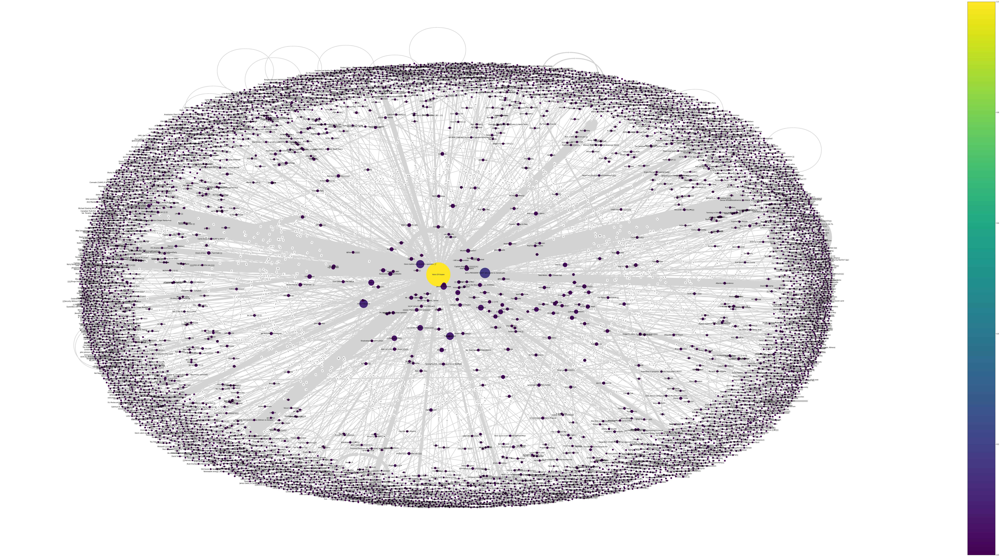

In [7]:
sample_size=9315
g, usernames, tweet_texts, df_small = create_network(sample_size, seed=5)
pos = nx.spring_layout(g, seed=77)

centrality = nx.out_degree_centrality(g)
centralities = [v*500000+100 for v in centrality.values()]


edgewidth = [g.get_edge_data(u, v)['weight']*3 for u, v in g.edges()]

nodes = nx.draw_networkx_nodes(g, pos, node_size=centralities, node_color=centralities)


edge_labels = nx.get_edge_attributes(g, "weight")

edges = nx.draw_networkx_edges(
    g,
    pos,
    arrowstyle="->",
    arrowsize=edgewidth,
    width=edgewidth,
    edge_color='lightgrey',
    #edge_cmap=cmap,
)



nx.draw_networkx_labels(g, pos, font_size=10, font_family="sans-serif", labels=usernames)
nx.draw_networkx_edge_labels(g, pos, edge_labels)



cmap = plt.cm.viridis
pc = mpl.collections.PatchCollection(edges, cmap=cmap)
plt.colorbar(pc)
plt.gcf().set_size_inches(128, 64)
ax = plt.gca()
ax.set_axis_off()
plt.savefig(f'network_{sample_size}.png')
plt.show()

### Graph Info

In [8]:
nx.info(g)

'DiGraph with 6432 nodes and 1850 edges'

### plotly

In [9]:
# sample_size=9315
# G, usernames, tweet_texts, df_small = create_network(sample_size, seed=5)
# pos = nx.spring_layout(g, seed=77)
G = g.copy()
for n, p in pos.items():
    G.nodes[n]['pos'] = p
# G = nx.relabel_nodes(G, username)

In [ ]:
edge_x = []
edge_y = []
for edge in G.edges():
    x0, y0 = G.nodes[edge[0]]['pos']
    x1, y1 = G.nodes[edge[1]]['pos']
    edge_x.append(x0)
    edge_x.append(x1)
    edge_x.append(None)
    edge_y.append(y0)
    edge_y.append(y1)
    edge_y.append(None)

edge_trace = go.Scatter(
    x=edge_x, y=edge_y,
    line=dict(width=0.5, color='#888'),
    hoverinfo='none',
    mode='lines')

node_x = []
node_y = []
node_name = []
for node in G.nodes():
    x, y = G.nodes[node]['pos']
    node_x.append(x)
    node_y.append(y)

node_trace = go.Scatter(
    x=node_x, y=node_y,
    mode='markers',
    hoverinfo='text',
    marker=dict(
        showscale=True,
        # colorscale options
        #'Greys' | 'YlGnBu' | 'Greens' | 'YlOrRd' | 'Bluered' | 'RdBu' |
        #'Reds' | 'Blues' | 'Picnic' | 'Rainbow' | 'Portland' | 'Jet' |
        #'Hot' | 'Blackbody' | 'Earth' | 'Electric' | 'Viridis' |
        colorscale='Electric',
        reversescale=True,
        color=[],
        size=10,
        colorbar=dict(
            thickness=15,
            title='Node Connections',
            xanchor='left',
            titleside='right'
        ),
        line_width=2))


In [ ]:
node_adjacencies = []
node_text = []
for node, adjacencies in enumerate(G.adjacency()):
    node_adjacencies.append(len(adjacencies[1]))
    if adjacencies[0] in usernames:
        node_text.append(usernames[adjacencies[0]] + ' # of connections: '+str(len(adjacencies[1])))
    else:
        node_text.append('unknown # of connections: '+str(len(adjacencies[1])))

node_trace.marker.color = node_adjacencies
node_trace.text = node_text

In [ ]:
fig = go.Figure(data=[edge_trace, node_trace],
             layout=go.Layout(
                title='<br>Hashtag Climatehoax Network Analysis</br>',
                titlefont_size=16,
                showlegend=False,
                hovermode='closest',
                margin=dict(b=20,l=5,r=5,t=40),
                annotations=[ dict(
                    text="Python code: <a href='https://plotly.com/ipython-notebooks/network-graphs/'> https://plotly.com/ipython-notebooks/network-graphs/</a>",
                    showarrow=False,
                    xref="paper", yref="paper",
                    x=0.005, y=-0.002 ) ],
                xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
                )
fig.show()

centrality


In [ ]:
sorted_centrality = {k: v for k, v in sorted(centrality.items(), key=lambda item: item[1], reverse=True)}

top20 = pd.DataFrame(columns=df_small.columns)
print(top20.columns)
for idx, (author_id, cent_score) in enumerate(sorted_centrality.items()):
    if idx == 20: break
    try:
        #print(f'{idx, usernames[author_id], author_id, cent_score}')
        new_user = df[df.author_id==author_id]
        top20 = pd.concat([top20, new_user])
    except:
        continue
top20

In [ ]:
rank_names = list()
for col in top20.itertuples(index = False):
    rank_names.append(json.loads(col.author)['name'])
name_series = pd.Series(rank_names, name='user name')#, ignore_index=True)
top20['username'] = rank_names

In [ ]:
reply_to_names = list()
for col in top20.itertuples(index = False):
    try:
        reply_name = usernames[col.in_reply_to_user_id]
        reply_to_names.append(reply_name)
        print(reply_name)
    except:
        continue
reply_name_series = pd.Series(reply_to_names, name='reply_to_user_name')#, ignore_index=True)
top20['reply_to_user_name'] = reply_name_series

In [ ]:
top20 = top20.drop(columns=['okay'])
top20

In [ ]:
top20.to_csv('top20_users.csv')

In [ ]:
set(top20.username)

In [ ]:
simplified = top20.copy()
simplified.text

In [ ]:
simplified.groupby('username').count()